In [1]:
#imports

import shutil

import cv2
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import split_folders
import sklearn 


In [2]:
#Defining the paths for images

path_ASL_alphabet_train = "D:\Github\MAIS202\AmericanSignLanguage-Translator\Images\asl-alphabet\asl_alphabet_train\asl_alphabet_train"
path_ASL_alphabet_test = "D:\Github\MAIS202\AmericanSignLanguage-Translator\Images\asl-alphabet\asl_alphabet_test\asl_alphabet_test"

#Note: TODO Dataset for digits is saved as a .npy file. Will be done for next deliverable



In [3]:


# # Loading images from a folder
# def load_images (folder):
#     images = []
#     for image_name in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder,image_name))
#         if img is not None:
#             images.append(img)
    
#     return images


In [4]:

# for folder_name in os.listdir(sample_path):
#     mk_dir_path = os.path.join(sample_path,folder_name)
       
#     shutil.rmtree(mk_dir_path)

In [7]:
# Top level data directory. Here we assume the format of the directory conforms
#   to the ImageFolder structure

from tqdm.notebook import trange
from tqdm.notebook import tqdm




input_path = R'D:\Github\MAIS202\AmericanSignLanguageTranslator\Images\Extra Datasets\image_dataset_folders\significant-asl-sign-language-alphabet-dataset\test_set'
sample_path = R'D:\Github\MAIS202\AmericanSignLanguageTranslator\Images\Extra Datasets\image_dataset_folders\significant-asl-sign-language-alphabet-dataset\gray_test'
create_gray = False

if not(os.path.isdir(sample_path)): #if sample path not created, make it.
    os.mkdir(sample_path) 

if create_gray:
    
    for folder_name in os.listdir(input_path): #populate sample with with images
        mk_dir_path = os.path.join(sample_path,folder_name)


        if not(os.path.isdir(mk_dir_path)):
            os.mkdir(mk_dir_path)

        for image_name in tqdm(os.listdir(input_path+'\\'+ folder_name)):

            img = cv2.imread(os.path.join(input_path,folder_name,image_name) )

            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)#convert images to grayscale
            cv2.imwrite(os.path.join(mk_dir_path,image_name),gray_img)



(200, 200, 3)


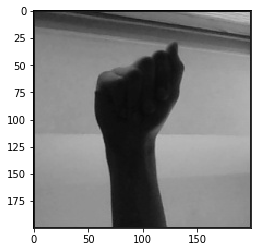

In [8]:
#What does an image look like
p = R'D:\Github\MAIS202\AmericanSignLanguageTranslator\Images\asl-alphabet\asl_alphabet_train\gray\A\A1.jpg.jpg'

img = cv2.imread(p)
print (img.shape)


plt.imshow(img)

# cv2.imshow("img",img)


In [9]:

#Splitting data into validation, training, and test samples
import split_folders
data_dir = R"D:\Github\MAIS202\AmericanSignLanguageTranslator\Images\Extra Datasets\image_dataset_folders\significant-asl-sign-language-alphabet-dataset\Grey_set_split"

need_to_split = False
if need_to_split:
    tqdm (split_folders.ratio (input=sample_path, output = data_dir, seed = 1337, ratio = (0.8,0.1,0.1)) )


In [10]:

# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = "resnet"

# Number of classes in the dataset
num_classes = 24

# Batch size for training (change depending on how much memory you have)
batch_size = 50

# Number of epochs to train for
num_epochs = 15

# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = False


In [11]:
from tqdm.notebook import tqdm, trange

def train_model(model, dataloaders, criterion, optimizer, path, num_epochs=25, is_inception=False):
    since = time.time()

    PATH = path

    epochs = []
    
    val_acc_history = []
    val_loss_history = []
    
    train_acc_history = []
    train_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in tqdm(range(num_epochs)):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            running_count = 0
            
            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                        
                    else:
                        
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        
                        
                        
                running_count +=1  #Since we started at 0
                
                # statistics

                    
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model  #This is taking the model with the best epoch weights.
            #does this avoid over-training???
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(best_model_wts, PATH)  
            if phase == 'val':
                val_acc_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)
                epochs.append(epoch)
            elif phase == 'train':
                train_acc_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)
 


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, epochs, train_loss_history, train_acc_history, val_loss_history, val_acc_history

In [12]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [13]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

# Print the model we just instantiated
print(model_ft)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [12]:
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
#         transforms.RandomResizedCrop(input_size),
        transforms.Resize((input_size,input_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((input_size,input_size)),
#         transforms.CenterCrop(input_size),
        transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),    
}

print("Initializing Datasets and Dataloaders...")

# Create training and validation datasets
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
# Create training and validation dataloaders
dataloaders_dict = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'val']}

# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")



Initializing Datasets and Dataloaders...


In [42]:
print(dataloaders_dict)

a = next(iter(dataloaders_dict['train']))


{'train': <torch.utils.data.dataloader.DataLoader object at 0x000001F187C73610>, 'val': <torch.utils.data.dataloader.DataLoader object at 0x000001F187C61E50>}


tensor([[[0.7412, 0.7412, 0.7843,  ..., 0.9804, 0.9804, 0.9804],
         [0.5490, 0.5490, 0.6039,  ..., 0.9804, 0.9804, 0.9804],
         [0.2784, 0.2784, 0.3529,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.3294, 0.3294, 0.3294,  ..., 0.9255, 0.9216, 0.9216],
         [0.3451, 0.3451, 0.3451,  ..., 0.9294, 0.9255, 0.9255],
         [0.3529, 0.3529, 0.3529,  ..., 0.9294, 0.9255, 0.9255]],

        [[0.7412, 0.7412, 0.7843,  ..., 0.9804, 0.9804, 0.9804],
         [0.5490, 0.5490, 0.6039,  ..., 0.9804, 0.9804, 0.9804],
         [0.2784, 0.2784, 0.3529,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.3294, 0.3294, 0.3294,  ..., 0.9255, 0.9216, 0.9216],
         [0.3451, 0.3451, 0.3451,  ..., 0.9294, 0.9255, 0.9255],
         [0.3529, 0.3529, 0.3529,  ..., 0.9294, 0.9255, 0.9255]],

        [[0.7412, 0.7412, 0.7843,  ..., 0.9804, 0.9804, 0.9804],
         [0.5490, 0.5490, 0.6039,  ..., 0.9804, 0.9804, 0.9804],
         [0.2784, 0.2784, 0.3529,  ..., 0.9804, 0.9804, 0.

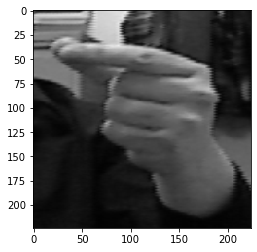

In [43]:
print (a[0][0])
img_ = a[0][1].permute(1,2,0).numpy()
print (img_.dtype)
# plt.imshow( (a[0][0].permute(1, 2, 0)*255).astype(np.uint8))
plt.imshow(img_)

print(a[1][1])

# print (a[1])

In [17]:
device

NameError: name 'device' is not defined

In [47]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.Adam(params_to_update, lr=0.001)

Params to learn:
	 conv1.weight
	 bn1.weight
	 bn1.bias
	 layer1.0.conv1.weight
	 layer1.0.bn1.weight
	 layer1.0.bn1.bias
	 layer1.0.conv2.weight
	 layer1.0.bn2.weight
	 layer1.0.bn2.bias
	 layer1.1.conv1.weight
	 layer1.1.bn1.weight
	 layer1.1.bn1.bias
	 layer1.1.conv2.weight
	 layer1.1.bn2.weight
	 layer1.1.bn2.bias
	 layer2.0.conv1.weight
	 layer2.0.bn1.weight
	 layer2.0.bn1.bias
	 layer2.0.conv2.weight
	 layer2.0.bn2.weight
	 layer2.0.bn2.bias
	 layer2.0.downsample.0.weight
	 layer2.0.downsample.1.weight
	 layer2.0.downsample.1.bias
	 layer2.1.conv1.weight
	 layer2.1.bn1.weight
	 layer2.1.bn1.bias
	 layer2.1.conv2.weight
	 layer2.1.bn2.weight
	 layer2.1.bn2.bias
	 layer3.0.conv1.weight
	 layer3.0.bn1.weight
	 layer3.0.bn1.bias
	 layer3.0.conv2.weight
	 layer3.0.bn2.weight
	 layer3.0.bn2.bias
	 layer3.0.downsample.0.weight
	 layer3.0.downsample.1.weight
	 layer3.0.downsample.1.bias
	 layer3.1.conv1.weight
	 layer3.1.bn1.weight
	 layer3.1.bn1.bias
	 layer3.1.conv2.weight
	 layer3.1.b

In [49]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()
PATH = "./Resnet-Feature_extract_False_gray_new_data_.pth"
# Train and evaluate
model_ft, epoch, train_loss, train_acc, val_loss, val_acc = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, PATH, num_epochs=num_epochs, is_inception=(model_name=="inception"))




torch.save(model_ft.state_dict(), PATH)




Epoch 0/14
----------



train Loss: 0.2046 Acc: 0.9382



val Loss: 0.2703 Acc: 0.9135
Epoch 1/14
----------



train Loss: 0.0850 Acc: 0.9733



val Loss: 0.0810 Acc: 0.9753
Epoch 2/14
----------



train Loss: 0.0612 Acc: 0.9816



val Loss: 0.0815 Acc: 0.9762
Epoch 3/14
----------



train Loss: 0.0514 Acc: 0.9837



val Loss: 0.1413 Acc: 0.9563
Epoch 4/14
----------



train Loss: 0.0427 Acc: 0.9871



val Loss: 0.0437 Acc: 0.9860
Epoch 5/14
----------



train Loss: 0.0315 Acc: 0.9905



val Loss: 0.0231 Acc: 0.9921
Epoch 6/14
----------



train Loss: 0.0348 Acc: 0.9896



val Loss: 0.0561 Acc: 0.9825
Epoch 7/14
----------



train Loss: 0.0274 Acc: 0.9915



val Loss: 0.0259 Acc: 0.9926
Epoch 8/14
----------



train Loss: 0.0247 Acc: 0.9929



val Loss: 0.0216 Acc: 0.9937
Epoch 9/14
----------



train Loss: 0.0216 Acc: 0.9938



val Loss: 0.0615 Acc: 0.9835
Epoch 10/14
----------



train Loss: 0.0177 Acc: 0.9941



val Loss: 0.0283 Acc: 0.9924
Epoch 11/14
----------



train Loss: 0.0213 Acc: 0.9942



val Loss: 0.0157 Acc: 0.9955
Epoch 12/14
----------



train Loss: 0.0169 Acc: 0.9955



val Loss: 0.0257 Acc: 0.9924
Epoch 13/14
----------



train Loss: 0.0173 Acc: 0.9953



val Loss: 0.0203 Acc: 0.9951
Epoch 14/14
----------



train Loss: 0.0117 Acc: 0.9969



val Loss: 0.0328 Acc: 0.9916

Training complete in 130m 54s
Best val Acc: 0.995513


15
15
15
15


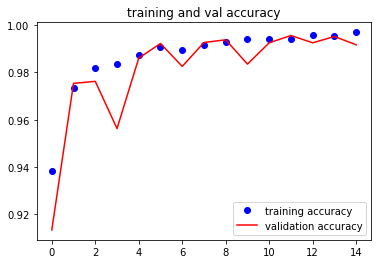

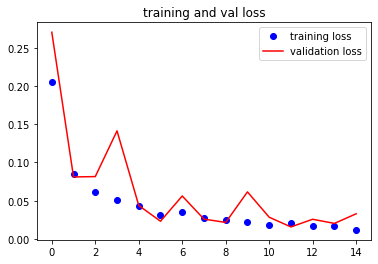

In [50]:
def show_train_plots(x, train_loss, train_acc, val_loss, val_acc):
    plt.plot ( x,train_acc, 'bo', label = 'training accuracy')

    plt.plot ( x,val_acc, 'b', label = 'validation accuracy',color = 'red')
    plt.title ('training and val accuracy')
    plt.legend()
    plt.figure
    plt.show()

    plt.plot ( x,train_loss, 'bo', label = 'training loss')

    plt.plot (x, val_loss, 'b', label = 'validation loss', color='red')
    plt.title ('training and val loss')
    plt.legend()
    plt.figure

    plt.show()

# t_loss = train_loss[0::2]
# t_acc = train_acc[0::2]
# v_loss = val_loss[0::2]
# v_acc = val_acc[0::2]
    
npy_path = R"D:\Github\MAIS202\AmericanSignLanguage-Translator"


np.savetxt(os.path.join(npy_path,"train_loss_Res_False_gray_new_data_.npy"), train_loss)
np.savetxt(os.path.join(npy_path,"train_acc_Res_False_gray_new_data_.npy"),train_acc)
np.savetxt(os.path.join(npy_path,"val_loss_Res_False_gray_new_data_.npy"),val_loss)
np.savetxt(os.path.join(npy_path,"val_acc_Res_False_gray_new_data_.npy"), val_acc)
    
    


print(len(epoch))

print(len(train_loss))
print(len(train_acc))

print (len(val_loss))
    

show_train_plots (epoch, train_loss,train_acc,val_loss, val_acc)

    

In [14]:
def eval_model(model, dataloaders):

    ids = np.array([])
    pred = np.array([])

    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_corrects = 0
    count = 0
    # Iterate over data.
    for inputs, labels in dataloaders:
        count +=1
        inputs = inputs.to(device)
        labels = labels.to(device)
        # print(i)
        # print(dataloaders[phase].dataset.samples[i])
        # print(dataloaders[phase].dataset.samples[i][0].split("/")[3].split(".")[0])

        # zero the parameter gradients

        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)

            _, preds = torch.max(outputs, 1)
            if preds == labels.data:
                running_corrects +=1

            ids = np.concatenate( (ids, labels.cpu().numpy() ), axis=None)

            pred = np.concatenate((pred, preds.cpu().numpy()), axis=None)
            print ("PRED: {}".format(pred))
            print ("IDS: {}".format(ids))

            # print(preds.cpu().numpy())
            # print(labels.cpu().data.numpy())
        # statistics

    print ("Running_corrects: {}".format(running_corrects/count))

    return model, ids, pred

In [16]:
# Create training and validation datasets
# image_datasets_test = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['val', 'test']}
# Create training and validation dataloaders
# dataloaders_dict_test = {x: torch.utils.data.DataLoader(image_datasets_test[x], batch_size=1, shuffle=False, num_workers=4) for x in ['val', 'test']}
image_datasets_test = datasets.ImageFolder(os.path.join(data_dir, "test"), data_transforms['test'])
dataloaders_dict_test = torch.utils.data.DataLoader(image_datasets_test)

In [17]:

model_test, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

model_test.to(device)

model_test.load_state_dict(torch.load("./Resnet-Feature_extract_False_gray_new_data_.pth"))

_, ids, labels = eval_model(model_test, dataloaders_dict_test)


PRED: [0.]
IDS: [0.]
PRED: [0. 0.]
IDS: [0. 0.]
PRED: [0. 0. 0.]
IDS: [0. 0. 0.]
PRED: [0. 0. 0. 0.]
IDS: [0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0

  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.

 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0

  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.

  0.  0.  0.  0.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 

  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

  0.  0.  0.  0. 15. 12. 15.  0.  0.  0.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 

 18.  0.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.

 18.  0. 15.  0. 11. 11.  0.  0.  0. 11. 11.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  

 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

 15.  1.  2. 15.  1.  1.  1.  6.  1.  1.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

  1.  8.  1.  1.  1. 17.  1.  1.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1.

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

  1.  8.  2.  2. 20.  2. 15.  1.  1.  1.  1.  1.  1.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

  2.  2.  2.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

 13. 13.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.]
PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 1

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  4. 17. 17.  0.  0.  0.  0.  0.  4.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  4.  4. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  4.  0.  0. 18.  0.  0.  0.  0.  0.  0.  4.  0.  4.  0.  0.  0.  0.
  0.  0.  0.  0. 18.  4.  0.  0.  4.  0.  0.  4.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 15.  4.  0. 18.  0.  0.  0.  0.  0.  0.  4.  4.  0. 11.  0. 18. 15.  0.
  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  4.  0.  0.  4.  4.
  0.  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  4.
  0. 23.  0.  4.  0.  0.  0.  0.  0.  0.  0.  0. 15. 15.  0.  0.  0.  0.
  0.  0.  4.  0.  0.  0.  0. 18.  0.  0.  0. 

  3.  2. 17.  3. 15.  3.  3.  3.  3. 13.  3. 13.  3.  3.  3.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.

  3.]
IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

IDS: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

PRED: [ 0.  0.  0. ... 14.  3.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3.  3. 14.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3. 14.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 14.  3.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3.  3. 13.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3. 13.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 13.  3. 13.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3. 13.  2.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 

PRED: [ 0.  0.  0. ... 13.  2. 13.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  2. 13.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 13.  3.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3.  3. 15.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3. 15. 11.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 15. 11.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 11.  3.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [0. 0. 0. ... 3. 3. 2.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3.  2. 13.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  2. 13.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ... 13.  3.  3.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3.  3. 13.]
IDS: [0. 0. 0. ... 3. 3. 3.]
PRED: [ 0.  0.  0. ...  3. 13.  3.]
IDS: [0. 0. 0

PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 6.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 6. 6.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 6. 6. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 6. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 6.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 6. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 6. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4.  4. 17.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4. 17.  4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ... 17.  4.  4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4.  4. 11.]
ID

PRED: [0. 0. 0. ... 4. 4. 2.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 2. 6.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 2. 6. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 6. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4.  4. 16.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4. 16.  4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ... 16.  4.  8.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 8. 2.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 8. 2. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 2. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4.  4. 17.]
IDS: [0. 0. 0. ... 4. 4. 4.]
PRED: [ 0.  0.  0. ...  4. 17.  

IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [ 0.  0.  0. ... 12.  5.  5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5

PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 2.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 2. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [ 0.  0.  0. ...  2.  5. 20.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [ 0.  0.  0. ...  5. 20.  5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [ 0.  0.  0. ... 20.  5.  5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 5.]
IDS: [0. 0. 0. ... 5. 5. 5.]
PRED: [0. 0. 0. ... 5. 5. 2.]
IDS: [0.

PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6

PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6.]
PRED: [0. 0. 0. ... 6. 6. 6.]
IDS: [0. 0. 0. ... 6. 6. 6

IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7

PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7.]
PRED: [0. 0. 0. ... 7. 7. 7.]
IDS: [0. 0. 0. ... 7. 7. 7

PRED: [ 0.  0.  0. ...  8. 15.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ... 15.  8.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ...  8.  8. 16.]
IDS: [0.

PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ...  8.  8. 15.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ...  8. 15.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ... 15.  8.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ...  8.  8. 13.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ...  8. 13. 15.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ... 13. 15.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.  0. ... 15.  8.  8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 8. 8. 8.]
PRED: [ 0.  0.

PRED: [ 0.  0.  0. ... 14.  9.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9.  9. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9. 15.  7.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15.  7. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  7. 15.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15.  9.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 6.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 

PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9.  9. 14.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9. 14.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 14.  9.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9.  9. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9. 15.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15.  9.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 9. 5.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9.  5. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.

PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15. 15.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15.  9. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  9. 15. 20.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15. 20. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 20. 15.  3.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15.  3. 20.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  3. 20. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 20. 15. 15.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15. 15. 14.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 15. 14.  9.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ... 14.  9.  8.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 9. 8. 8.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [0. 0. 0. ... 8. 8. 8.]
IDS: [0. 0. 0. ... 9. 9. 9.]
PRED: [ 0.  0.  0. ...  8.  8. 10.]
I

PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 23.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 23. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 23. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: [ 0.  0.  0. ... 10. 10. 10.]
IDS: [ 0.  0.  0. ... 10. 10. 10.]
PRED: 

PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: 

PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 11. 11. 11.]
PRED: 

PRED: [ 0.  0.  0. ... 11. 12. 12.]
IDS: [ 0.  0.  0. ... 11. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 11. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 11. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12.  0.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12.  0. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ...  0. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12.  0.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12.  0. 13.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ...  0. 13. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 13. 12. 17.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 17. 18.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 17. 18. 14.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 18. 14. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: 

PRED: [ 0.  0.  0. ... 15. 15. 17.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 15. 17. 15.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 17. 15. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 15. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 11. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 11. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 13.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 13. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 13. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: 

PRED: [ 0.  0.  0. ... 12. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 11. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 11. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 11. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 11. 12. 17.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 17. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 17. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 12. 11. 18.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 11. 18. 12.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: [ 0.  0.  0. ... 18. 12. 11.]
IDS: [ 0.  0.  0. ... 12. 12. 12.]
PRED: 

PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13.  3.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13.  3. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ...  3. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: 

PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13. 13.  2.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13.  2. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ...  2. 13.  2.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ... 13.  2.  2.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ...  2.  2. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: [ 0.  0.  0. ...  2. 13. 13.]
IDS: [ 0.  0.  0. ... 13. 13. 13.]
PRED: 

PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 15.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 15. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 15. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: 

PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 11.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 11. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 11. 14. 15.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 15. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 15. 14. 15.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 15. 11.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 15. 11. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 11. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: 

PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 15.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 15. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 15. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: [ 0.  0.  0. ... 14. 14. 14.]
IDS: [ 0.  0.  0. ... 14. 14. 14.]
PRED: 

PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 18.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 18. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: 

PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 18.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 18. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 18. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 18.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 18. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 18. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 18.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 18. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 18. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 15. 15. 15.]
PRED: 

PRED: [ 0.  0.  0. ...  9.  7. 13.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  7. 13. 14.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 13. 14. 13.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 14. 13. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 13. 15. 20.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 20.  6.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 20.  6. 14.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  6. 14. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 14. 15. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 16. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16. 15. 21.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 21. 19.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 21. 19. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 19. 16.  2.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: 

PRED: [ 0.  0.  0. ... 16.  3. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  3. 16. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16. 15. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 15. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 16.  3.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16.  3. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  3. 16. 20.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16. 20.  3.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 20.  3. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  3. 15. 19.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 19. 19.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 19. 19. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 19. 16. 13.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16. 13.  3.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: 

PRED: [ 0.  0.  0. ... 12. 16. 20.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 16. 20. 20.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 20. 20.  6.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 20.  6. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  6. 15. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 15. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 15. 11.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 11. 22.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 11. 22. 22.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 22. 22.  8.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 22.  8. 14.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ...  8. 14. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 14. 15. 16.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: [ 0.  0.  0. ... 15. 16. 15.]
IDS: [ 0.  0.  0. ... 16. 16. 16.]
PRED: 

PRED: [ 0.  0.  0. ... 15.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17. 17. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17. 17.

PRED: [ 0.  0.  0. ...  4. 17.  2.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  2. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  2. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [0. 0. 0. ... 4. 4. 4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17. 17.  4.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ... 17.  4. 17.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  0.  0. ...  4. 17. 15.]
IDS: [ 0.  0.  0. ... 17. 17. 17.]
PRED: [ 0.  

PRED: [ 0.  0.  0. ...  7. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 18. 13.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 13. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 13. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11.  4.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11.  4. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ...  4. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: 

PRED: [ 0.  0.  0. ... 11. 15. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 15. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11.  4.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11.  4. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ...  4. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: 

PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 11. 18.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11. 18. 11.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 18. 11.  4.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: [ 0.  0.  0. ... 11.  4. 15.]
IDS: [ 0.  0.  0. ... 18. 18. 18.]
PRED: 

PRED: [ 0.  0.  0. ... 19. 19. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 19. 19.  5.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 19.  5. 15.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ...  5. 15. 14.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 15. 14.  7.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 14.  7. 12.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ...  7. 12. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 12. 19. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 19. 19. 22.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 19. 22. 12.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 22. 12. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 12. 19. 20.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 19. 20. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: [ 0.  0.  0. ... 20. 19. 19.]
IDS: [ 0.  0.  0. ... 19. 19. 19.]
PRED: 

PRED: [ 0.  0.  0. ... 20. 14. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 14. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 15.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 15. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 15. 20. 14.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 14. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 14. 20.  7.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20.  7. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ...  7. 20. 18.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 18. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 18. 20. 15.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 15. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: 

PRED: [ 0.  0.  0. ... 20. 20. 14.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 14. 14.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 14. 14. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 14. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 14.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 14. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: 

PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 20.]
IDS: [ 0.  0.  0. ... 20. 20. 20.]
PRED: [ 0.  0.  0. ... 20. 20. 21.]
IDS: [ 0.  0.  0. ... 20. 20. 21.]
PRED: [ 0.  0.  0. ... 20. 21. 21.]
IDS: [ 0.  0.  0. ... 20. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: 

PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 14.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 14. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 14. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 20.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 20. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 20. 21. 20.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 20. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 20. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: 

PRED: [ 0.  0.  0. ... 15. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 20.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 20. 20.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 20. 20. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 20. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: [ 0.  0.  0. ... 21. 21. 21.]
IDS: [ 0.  0.  0. ... 21. 21. 21.]
PRED: 

PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22.  6.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22.  6. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ...  6. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 12.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: 

PRED: [ 0.  0.  0. ... 22.  9. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ...  9. 22. 18.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 18. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 18. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 18.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 18. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 18. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 11.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 11.  8.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 11.  8. 14.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ...  8. 14. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 14. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 11.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 11. 18.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: 

PRED: [ 0.  0.  0. ... 18. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 18.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 18. 23.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 18. 23. 15.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 23. 15. 12.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 15. 12. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 12. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 12.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 12. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 12. 22. 22.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 22. 12.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 22. 12. 12.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: [ 0.  0.  0. ... 12. 12. 18.]
IDS: [ 0.  0.  0. ... 22. 22. 22.]
PRED: 

PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: 

PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: [ 0.  0.  0. ... 23. 23. 23.]
IDS: [ 0.  0.  0. ... 23. 23. 23.]
PRED: 

In [23]:

#if tensor object, confusion matrix.

def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)





              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       298
         1.0       0.85      0.98      0.91       262
         2.0       0.99      0.83      0.90       387
         3.0       0.58      0.93      0.71       188
         4.0       0.81      0.77      0.79       304
         5.0       0.86      0.98      0.91       246
         6.0       0.99      0.90      0.95       323
         7.0       1.00      0.99      0.99       298
         8.0       0.78      0.98      0.87       233
         9.0       0.86      0.93      0.89       290
        10.0       0.97      0.99      0.98       301
        11.0       0.81      0.82      0.82       278
        12.0       0.65      0.75      0.70       242
        13.0       0.97      0.79      0.87       350
        14.0       0.97      0.51      0.66       573
        15.0       0.95      0.78      0.85       349
        16.0       0.44      0.97      0.61       155
        17.0       0.95    

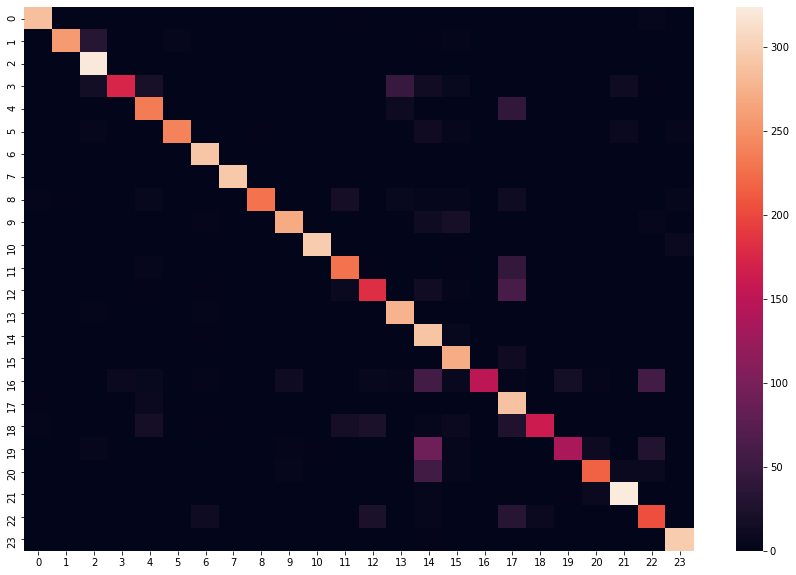

In [24]:
from sklearn import metrics
import seaborn as sn

cf = metrics.confusion_matrix(ids,labels) 
plt.figure(figsize = (15,10))

sn.heatmap(cf)
# classification_report(y_true, y_pred, target_names=target_names)
print (metrics.classification_report(labels, ids) )


# print (metrics.classification_report(ids,labels, digits=4))

In [93]:
from PIL import Image


def image_transform(image,startW, startH,endW,endH,count):

#     image = np.stack((image,)*3, axis=-1)
#     plt.imshow(image)
#     plt.show()
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    image = image[int(startH):int(endH),int(startW):int(endW)]
    path_ = R'D:\Github\MAIS202\AmericanSignLanguage-Translator\Images\Extra Datasets\image_dataset_folders\significant-asl-sign-language-alphabet-dataset\test_set'
    
    cv2.imwrite(os.path.join(path_,str(count) )+".jpg", image)
    
#     plt.imshow(image)
#     plt.show()
    
#     print (image.shape)
    
    
    
    
    pil_image = Image.fromarray(image)
    
    
    
    data_transforms = transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    img = data_transforms(pil_image)
    
#     print (img.permute(1,2,0))
#     print (img[0])
#     print("sizse {}".format(img.size()) )
    
    print ("numpyshape {}".format(np.rollaxis(img.numpy(),0,3).shape))
    
    plt.imshow( np.rollaxis(img.numpy(),0,3) )
    plt.show()
    
    
    
    return img
    

# classes = ("A","B","C","D","del","E","F","G","H","I","J","K","L","M","N","nothing","O","P","Q","R","S","space","T","U","V","W","X","Y","Z")
classes = ("A","B","C","D","E","F","G","H","I","K","L","M","N","O","P","Q","R","S","T","U","V","W","X","Y")

    
    
def run_app(model,classes):
    model.eval()
    cam = cv2.VideoCapture(0)
    cv2.namedWindow("test")

    width = cam.get(3)
    height = cam.get(4)
    
    crop_image_width = 200
    crop_image_height = 200
    
    startW = (width-crop_image_width)/2
    startH = (height - crop_image_height)/2
    
    
    img_counter = 0

    while True:
        ret, frame = cam.read()
        frame = cv2.flip(frame,1)
        
        if not ret:
            raise Exception("Unaccessible Webcam")
        
#         gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        rectangle = cv2.rectangle(frame, (int (startW),int (startH)), ((int(startW)+int(crop_image_width)),int(startH)+int(crop_image_height)), (255,0,0), 1 )
        cv2.imshow('test',rectangle)
        
        if not ret:
            raise ValueError("Unaccessible Webcam")
            break
        k = cv2.waitKey(1)

        if k%256 == 27:
            # ESC pressed
            print("Escape hit, closing...")
            break
        elif k%256 == 32:
            # SPACE pressed
            inputs = image_transform(rectangle,int( startW),int(startH),int(startW+crop_image_width), int(startH+crop_image_height), img_counter)
            inputs = inputs.unsqueeze(0)
            output = model(inputs)
            _,pred = torch.max(output,1)
            print (classes[pred.item()])
            img_counter += 1
    
    cam.release()

    cv2.destroyAllWindows()
    

test_model, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)
test_model.load_state_dict(torch.load('./Resnet-Feature_extract_True_color_new_data.pth')) #"./Resnet-Feature_extract_False.pth"


<All keys matched successfully>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


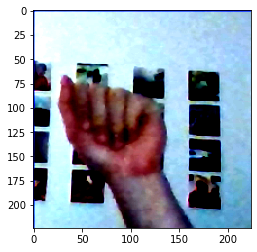

A


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


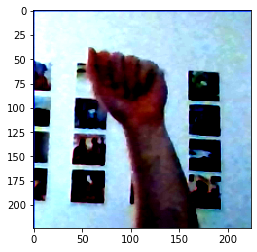

L


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


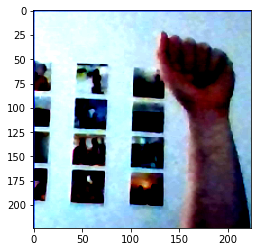

A


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


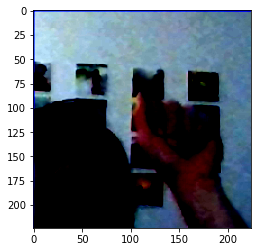

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


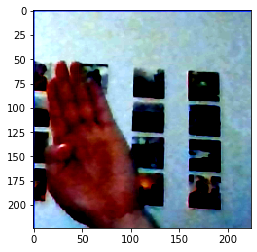

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


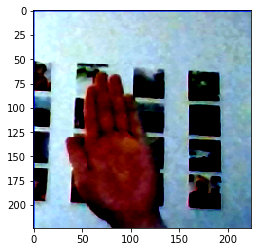

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


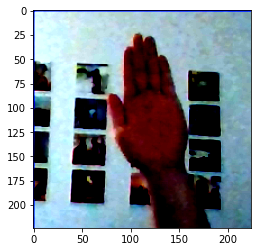

U


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


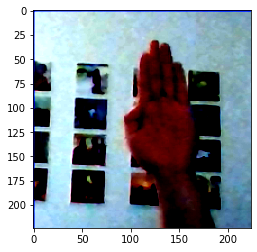

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


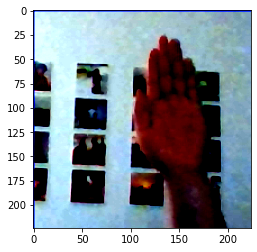

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


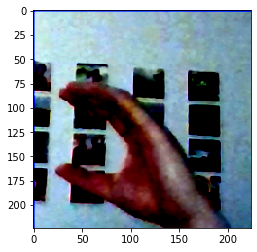

H


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


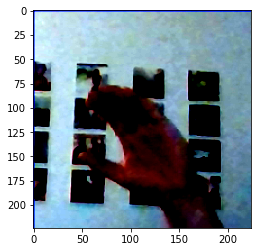

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


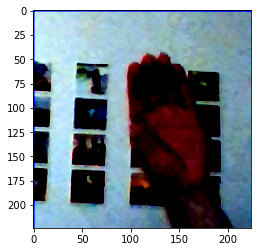

I


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


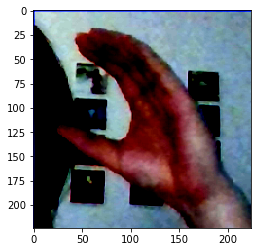

L


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


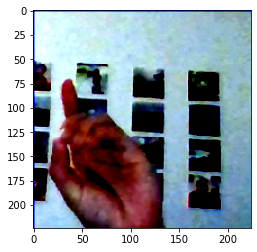

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


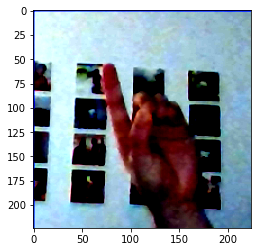

U


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


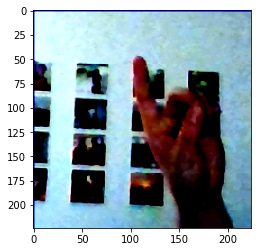

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


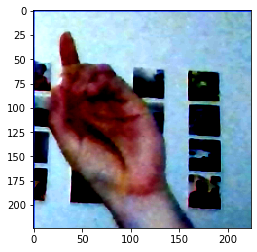

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


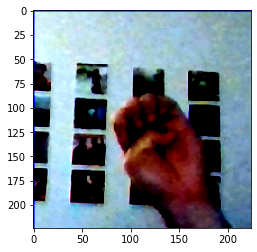

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


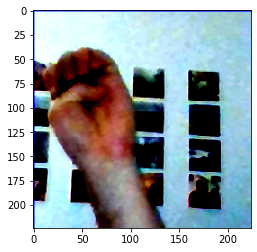

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


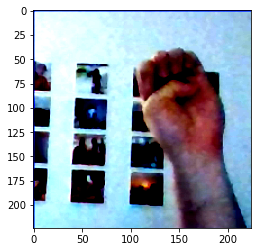

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


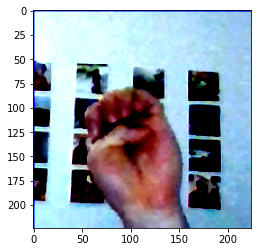

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


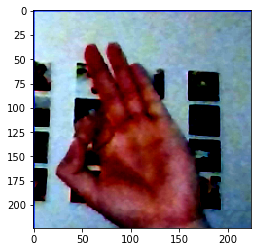

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


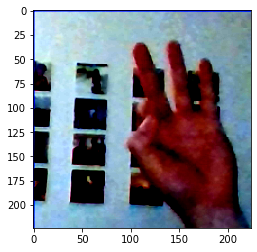

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


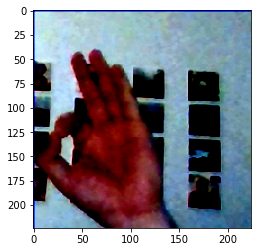

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


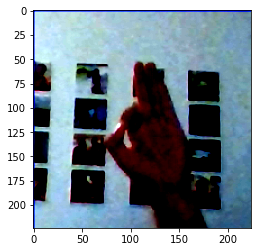

K


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


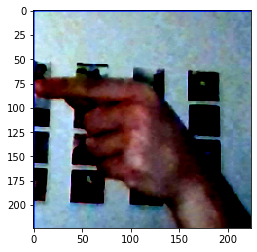

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


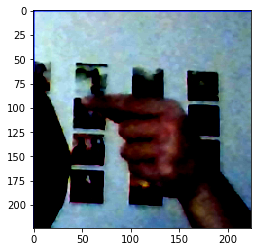

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


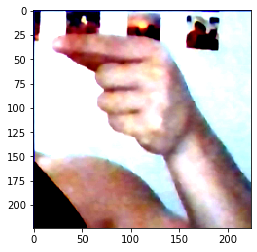

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


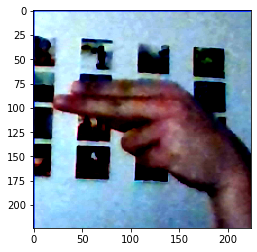

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


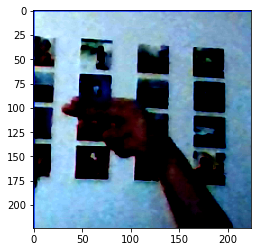

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


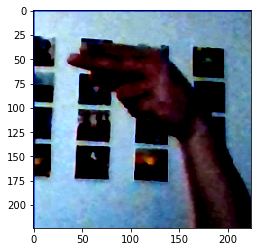

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


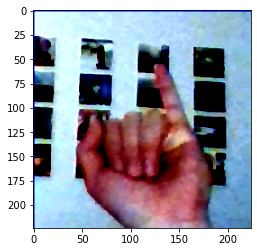

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


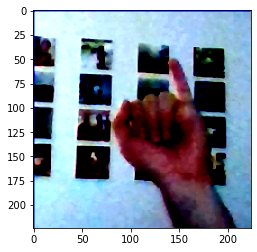

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


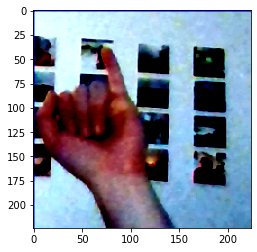

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


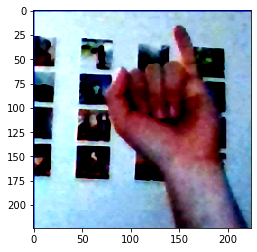

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


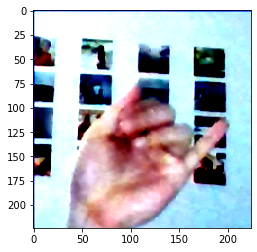

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


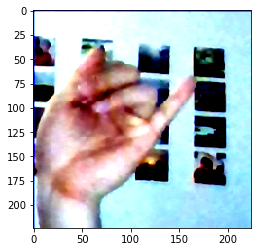

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


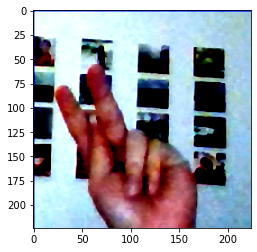

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


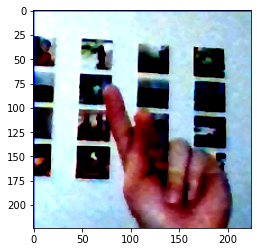

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


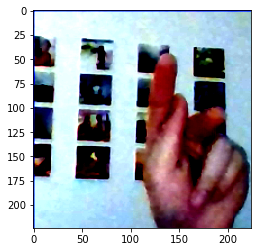

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


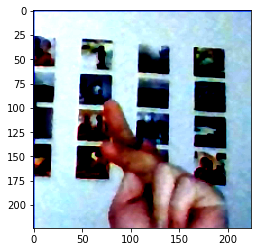

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


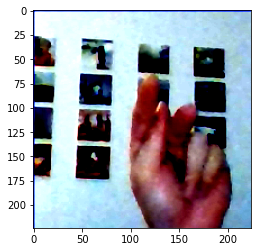

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


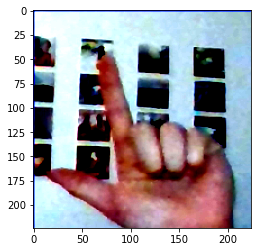

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


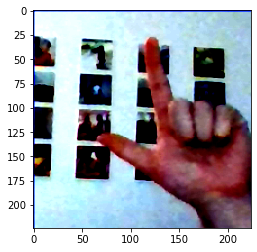

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


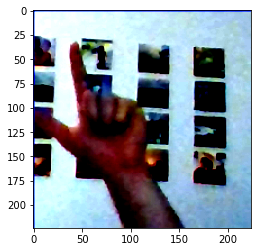

L


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


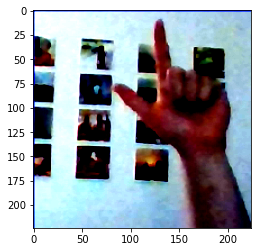

I


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


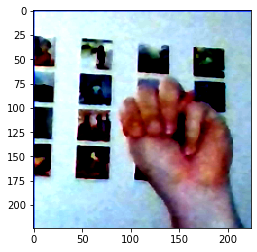

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


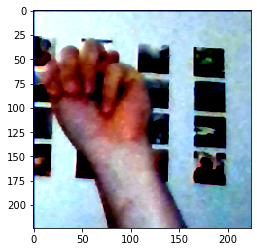

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


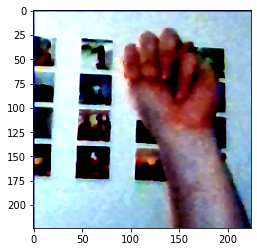

A


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


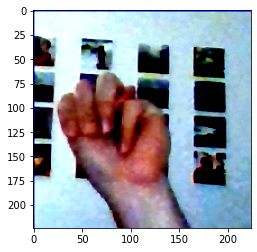

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


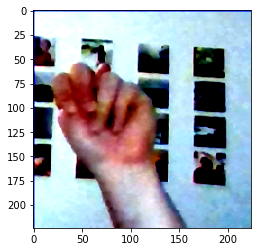

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


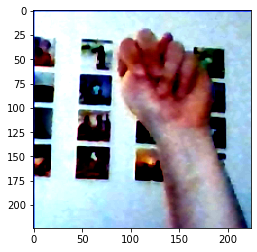

A


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


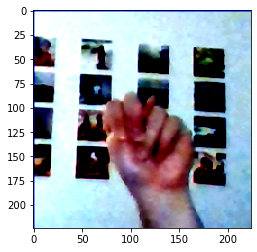

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


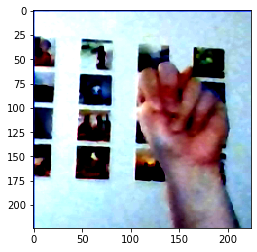

I


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


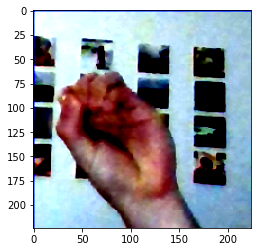

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


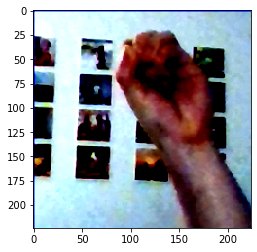

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


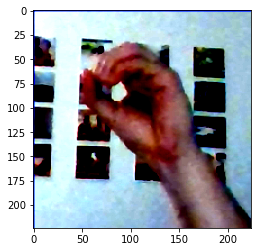

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


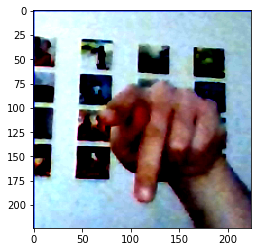

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


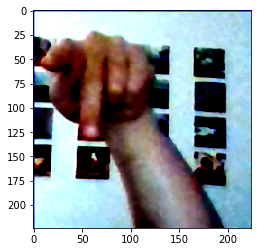

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


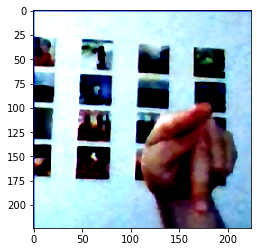

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


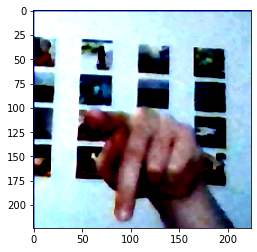

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


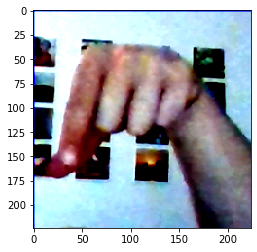

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


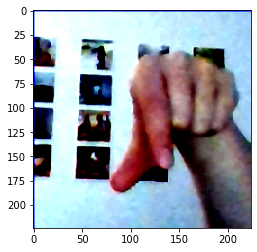

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


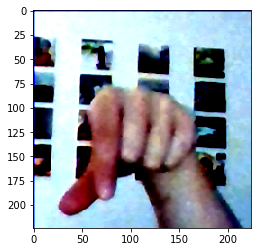

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


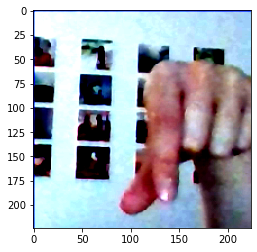

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


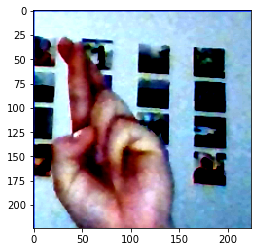

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


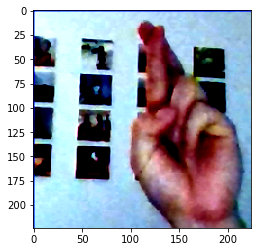

W


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


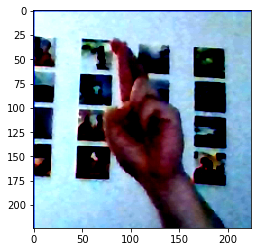

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


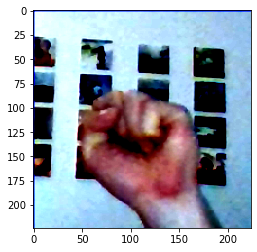

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


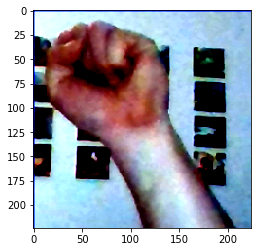

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


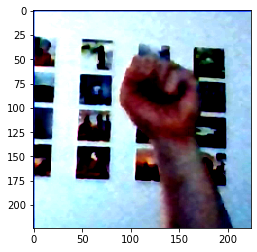

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


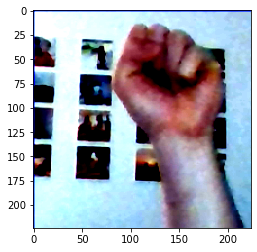

A


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


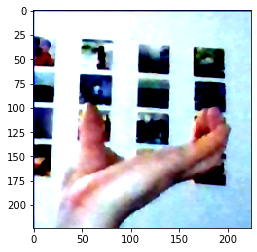

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


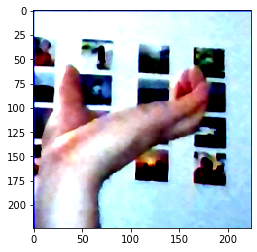

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


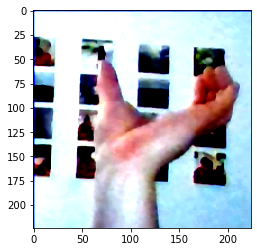

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


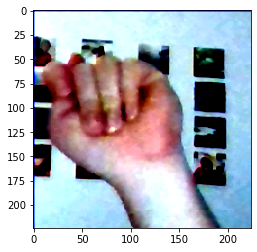

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


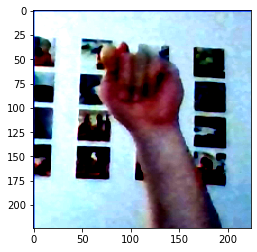

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


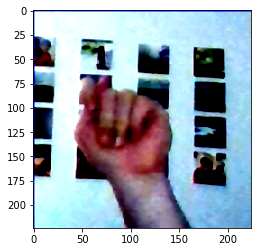

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


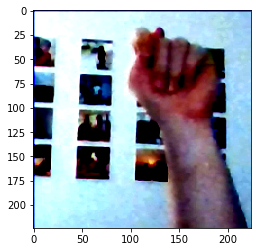

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


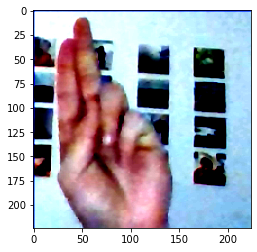

W


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


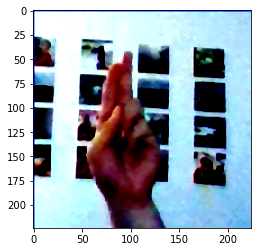

K


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


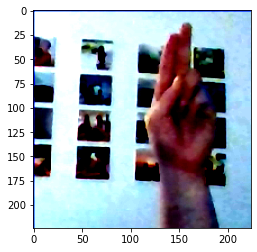

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


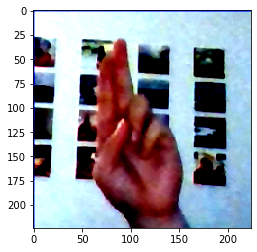

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


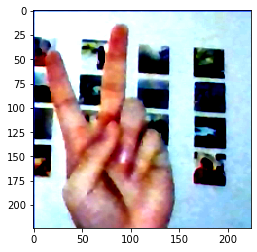

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


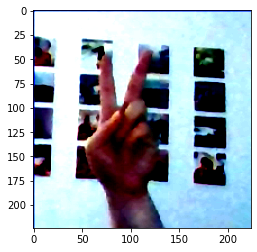

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


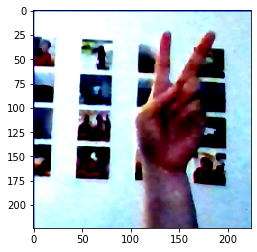

K


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


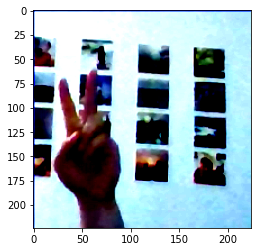

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


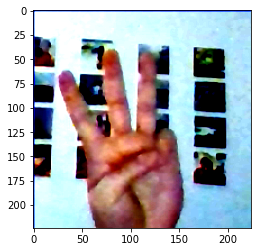

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


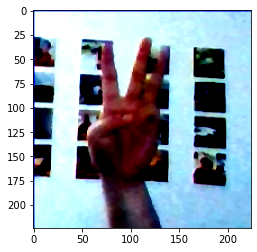

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


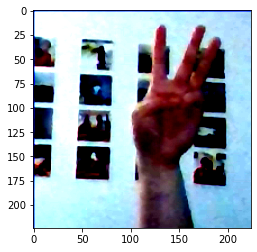

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


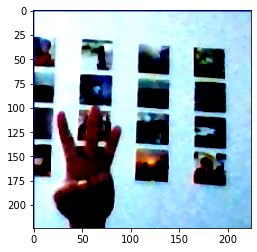

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


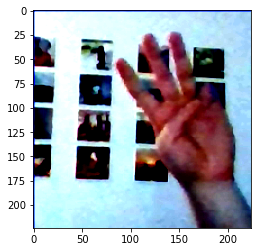

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


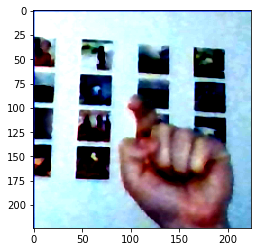

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


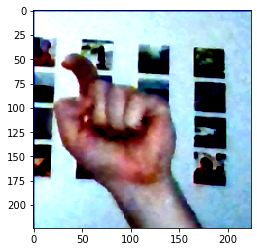

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


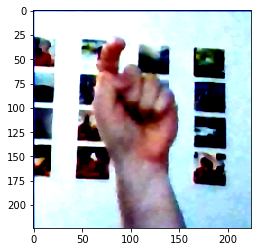

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


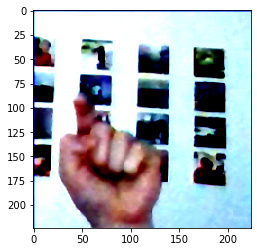

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


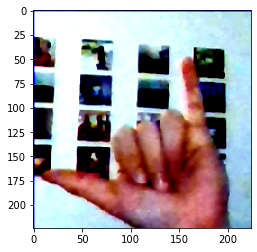

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


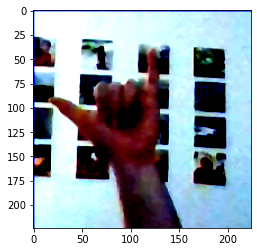

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


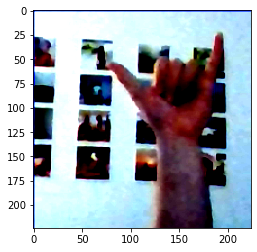

I


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


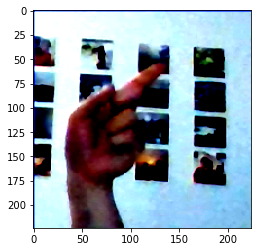

G


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


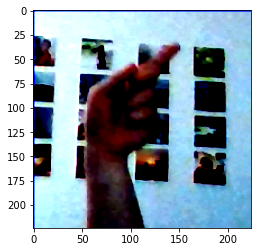

B


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


numpyshape (224, 224, 3)


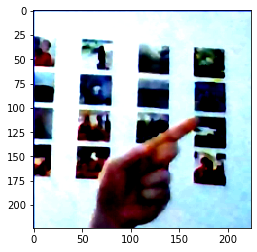

G
Escape hit, closing...


In [94]:
run_app(test_model, classes)

In [16]:
device

NameError: name 'device' is not defined

In [19]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
num_classes = 29

model_test, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

model_test.to(device)

model_test.load_state_dict(torch.load("./Resnet-Feature_extract_False.pth"))

<All keys matched successfully>

In [20]:
webcam_transforms = transforms.Compose([
        transforms.Resize((input_size,input_size)),
        transforms.ToTensor(), ])

webcam_path = R"D:\Github\MAIS202\AmericanSignLanguageTranslator\Images\Extra Datasets\image_dataset_folders\significant-asl-sign-language-alphabet-dataset\gray_test"

web_path_dataset = datasets.ImageFolder(webcam_path, webcam_transforms)
web_data_loader = torch.utils.data.DataLoader(web_path_dataset)

torch.Size([3, 224, 224])
torch.Size([224, 224, 3])


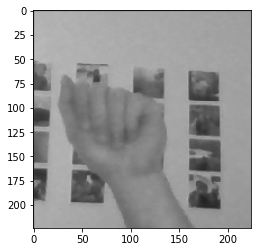

In [21]:
b = next(iter(web_data_loader))

_img = b[0].squeeze()
print (_img.size())
_img = _img.permute(1,2,0)
print (_img.size())

_img = _img.numpy()
plt.imshow(_img)

In [22]:
_,ids_web,labels_web = eval_model(model_test, web_data_loader)

PRED: [13.]
IDS: [0.]
PRED: [13. 12.]
IDS: [0. 0.]
PRED: [13. 12. 12.]
IDS: [0. 0. 0.]
PRED: [13. 12. 12. 13.]
IDS: [0. 0. 0. 0.]
PRED: [13. 12. 12. 13. 12.]
IDS: [0. 0. 0. 0. 1.]
PRED: [13. 12. 12. 13. 12.  5.]
IDS: [0. 0. 0. 0. 1. 1.]
PRED: [13. 12. 12. 13. 12.  5.  5.]
IDS: [0. 0. 0. 0. 1. 1. 1.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1. 2.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 2.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 2. 2.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 2. 2. 2.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12. 13.]
IDS: [0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 2. 2. 2. 3.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 

 12. 22. 22. 12. 12.  5. 22.  5.  5. 12. 13.  5. 12. 13. 12. 13.  5.]
IDS: [ 0.  0.  0.  0.  1.  1.  1.  1.  1.  2.  2.  2.  2.  3.  3.  3.  3.  4.
  4.  4.  4.  5.  5.  5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  8.  8.  9.
  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12. 13. 12.  1. 12. 22.
 12. 12.  5. 13.  5. 27.  5. 14. 12. 27.  5.  5. 12. 13.  5. 13. 12. 12.
 12. 22. 22. 12. 12.  5. 22.  5.  5. 12. 13.  5. 12. 13. 12. 13.  5. 12.]
IDS: [ 0.  0.  0.  0.  1.  1.  1.  1.  1.  2.  2.  2.  2.  3.  3.  3.  3.  4.
  4.  4.  4.  5.  5.  5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  8.  8.  9.
  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13. 13.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12. 13. 12.  1. 12. 22.
 12. 12.  5. 13.  5. 27.  5. 14. 12. 27.  5.  5. 12. 13.  5. 13. 12. 12.
 12. 22. 22. 12. 12.  5. 22.  5.  5. 12. 13.  5. 12. 13. 12. 13.  5. 12.
  5.]
IDS: [ 0.  0.  0.  0.  1.  

 12. 13.]
IDS: [ 0.  0.  0.  0.  1.  1.  1.  1.  1.  2.  2.  2.  2.  3.  3.  3.  3.  4.
  4.  4.  4.  5.  5.  5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  8.  8.  9.
  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13. 13.
 13. 14. 14. 14. 14. 15. 15. 15. 15. 16. 16. 16. 17. 17. 17. 17. 18. 18.
 18. 18.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12. 13. 12.  1. 12. 22.
 12. 12.  5. 13.  5. 27.  5. 14. 12. 27.  5.  5. 12. 13.  5. 13. 12. 12.
 12. 22. 22. 12. 12.  5. 22.  5.  5. 12. 13.  5. 12. 13. 12. 13.  5. 12.
  5.  5. 13.  1.  5. 15. 13. 12. 12. 12.  5.  5.  5. 13. 13. 13. 12. 13.
 12. 13. 13.]
IDS: [ 0.  0.  0.  0.  1.  1.  1.  1.  1.  2.  2.  2.  2.  3.  3.  3.  3.  4.
  4.  4.  4.  5.  5.  5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  8.  8.  9.
  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13. 13.
 13. 14. 14. 14. 14. 15. 15. 15. 15. 16. 16. 16. 17. 17. 17. 17. 18. 18.
 18. 18. 19.]
PRED: [13. 12. 12. 13. 12.  5.  5. 12. 12.  1. 12.  5. 12. 1

              precision    recall  f1-score   support

         0.0       1.00      0.19      0.32        21
         1.0       1.00      0.26      0.42        19
         2.0       0.00      0.00      0.00         0
         3.0       0.00      0.00      0.00         0
         4.0       0.00      0.00      0.00         0
         5.0       0.25      1.00      0.40         1
         6.0       1.00      0.25      0.40        12
         7.0       1.00      0.50      0.67         6
         8.0       0.00      0.00      0.00         2
         9.0       0.00      0.00      0.00         1
        10.0       1.00      1.00      1.00         4
        11.0       0.00      0.00      0.00         0
        12.0       0.00      0.00      0.00         0
        13.0       0.00      0.00      0.00         0
        14.0       0.50      1.00      0.67         2
        15.0       0.25      1.00      0.40         1
        16.0       0.00      0.00      0.00         0
        17.0       0.50    

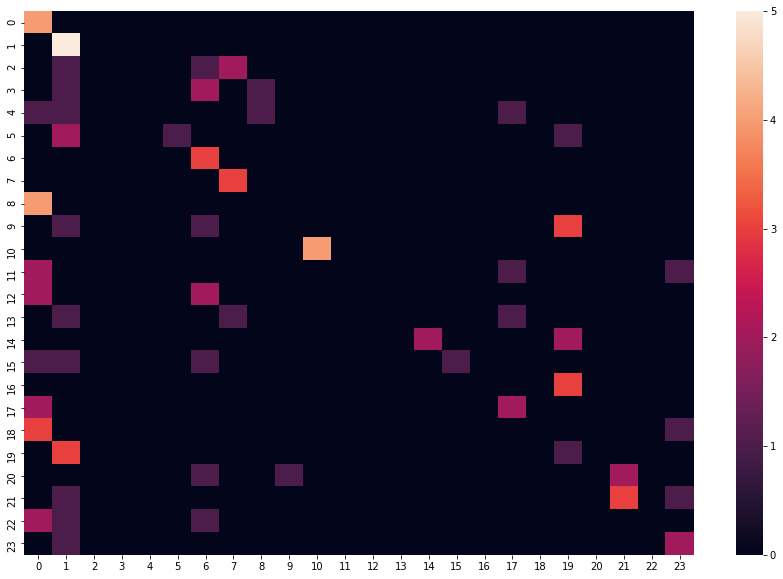

In [35]:
cf_web = metrics.confusion_matrix(ids_web,labels_web) 
plt.figure(figsize = (15,10))

sn.heatmap(cf_web)
# classification_report(y_true, y_pred, target_names=target_names)
print (metrics.classification_report(labels_web, ids_web) )